
###  由于数据中不存在缺失值，所以本数据集不进行缺失值补全和对比的工作，相关工作已在winemae-data_first150k中进行
# 由于同一数据集中数据处理方式相同，数据集的分析报告见
## Youtube-US.csv

------------------------------------------------------------------------------------------我是分割线------------------------------------------------------------------------------------------------

##  一、数据可视化和摘要

## 1.1  数据集摘要
YouTube（世界着名的视频分享网站）维护着平台上热门视频的列表。 根据Variety杂志的报道，“为了确定年度最热门的视频，YouTube使用了多种因素，包括衡量用户互动（观看次数，分享，评论和喜欢）。 请注意，它们不是整个日历年中观看次数最多的视频“。 YouTube趋势列表中的优秀表演者是音乐视频（例如着名的男性化的“Gangam Style”），名人和/或真人秀电视节目，以及YouTube众所周知的随机照相机病毒视频。

此数据集是热门YouTube热门视频的每日记录。数据集中包含各个地区的视频的[video_id], [trending_date], [title], [channel_title], [category_id],[publish_time], [tags], [views], [likes], [dislikes], [comment_count],[humbnail_link],[comments_disabled],[ratings_disable]，[ideo_error_or_removed],[description']等信息
      

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pandas import DataFrame,Series
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures 

In [52]:
filename='C:/Users/Administrator/Desktop/coda/youtube-new/DEvideos.csv'
df=pd.read_csv(filename)

In [53]:
cols = df.columns
print(df.shape)
print(cols)

(40840, 16)
Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description'],
      dtype='object')


In [54]:
cname='channel_title'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

channel_title
#AndresSTyle                                                                                          3
#Mentale Zuflucht                                                                                    92
#Mind Warehouse                                                                                       1
#WDR360                                                                                               8
(Fe)MaleASMR                                                                                          2
++movies                                                                                              1
- 欢迎订阅 -浙江卫视【奔跑吧】官方频道                                                                                15
0815BBQ                                                                                               2
1 kafe me Labin [Official]                                                                           13
1. FC Kaiserslautern                              

In [55]:
cname='category_id'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

category_id
1      2376
2       873
10     2372
15      251
17     2752
19      141
20     1565
22     5988
23     2534
24    15292
25     2935
26     1745
27      844
28      806
29      256
30        2
43      107
44        1
dtype: int64


In [56]:
cname='publish_time'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

publish_time
2012-04-18T10:58:15.000Z     1
2014-01-19T23:13:43.000Z     1
2014-01-29T14:17:52.000Z     2
2014-05-22T20:04:27.000Z     1
2015-01-18T20:19:24.000Z     1
2016-05-14T13:51:52.000Z     1
2016-05-14T14:42:00.000Z     1
2016-06-06T16:18:28.000Z     1
2016-08-03T01:55:28.000Z     1
2016-09-23T14:00:00.000Z     2
2016-11-21T19:09:56.000Z     1
2017-04-29T10:26:36.000Z     1
2017-07-03T12:23:09.000Z     1
2017-07-22T12:16:11.000Z     1
2017-08-18T07:57:47.000Z     1
2017-09-14T02:57:19.000Z     1
2017-10-23T19:13:40.000Z     1
2017-10-26T00:43:03.000Z     1
2017-10-28T03:06:05.000Z     1
2017-11-04T02:05:40.000Z     1
2017-11-06T19:01:07.000Z     1
2017-11-08T13:43:38.000Z     2
2017-11-09T11:04:14.000Z     1
2017-11-10T14:10:46.000Z     1
2017-11-10T15:36:15.000Z     1
2017-11-10T17:00:02.000Z     1
2017-11-10T17:00:03.000Z     1
2017-11-10T22:09:00.000Z     1
2017-11-10T23:02:57.000Z     1
2017-11-11T02:00:00.000Z     1
2017-11-11T06:22:23.000Z     1
2017-11-11T10:00:04.000Z  

In [57]:
cname='tags'
print(df[cname].head())
#pd.set_option('display.max_columns', None)#显示所有行
#pd.set_option('display.max_rows', None)#显示所有列
df.groupby(by=cname).size()


0    inscope21|"sing zu ende"|"gesangseinlagen"|"ge...
1    Kinder|"ferngesteuert"|"Kinder ferngesteuert"|...
2    last week tonight trump presidency|"last week ...
3    Physik|"Wissenschaft"|"Technik"|"Science-Ficti...
4    kelly|"missesvlog"|"kelly song"|"bausa"|"bausa...
Name: tags, dtype: object


tags
#1|"2017"|"2018"|"abonennten"|"cedarmy"|"cedmusic"|"depressionen"|"depressiv"|"deutsch"|"du fehlst mir"|"einsamkeit"|"fremdgehen"|"hass"|"ich hasse dich"|"ich kann dir nicht verzeihen"|"keine ist wie du"|"lass mich los"|"liebe"|"liebes lied"|"liebesaus"|"lieder zum nachdenken"|"lieder zum weinen"|"lyric video"|"rapper"|"sänger"|"schmerz"|"slyser"|"text"|"traurige geschichte"|"traurige melodie"|"trauriges lied"|"trends"|"trennung"|"youtube trends"|"zate"|"Diese Welt"|"Martina K"                                                                                                                                                                                                                         1
#1|"2017"|"2018"|"abonennten"|"cedarmy"|"cedmusic"|"depressionen"|"depressiv"|"deutsch"|"du fehlst mir"|"einsamkeit"|"fremdgehen"|"hass"|"ich hasse dich"|"ich kann dir nicht verzeihen"|"keine ist wie du"|"lass mich los"|"liebe"|"liebes lied"|"liebesaus"|"lieder zum nachdenken"|"lieder zum wein

In [58]:
cname='comments_disabled'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

comments_disabled
False    39796
True      1044
dtype: int64


In [59]:
cname='ratings_disabled'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

ratings_disabled
False    40168
True       672
dtype: int64


In [60]:
cname='video_error_or_removed'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

video_error_or_removed
False    40826
True        14
dtype: int64


In [61]:
cname='views'
print(df[cname].describe())
loss=len(df)-df[cname].count()
print("缺失值个数：",loss)

count    4.084000e+04
mean     6.034553e+05
std      2.348963e+06
min      5.180000e+02
25%      2.706875e+04
50%      1.192770e+05
75%      4.431015e+05
max      1.138762e+08
Name: views, dtype: float64
缺失值个数： 0


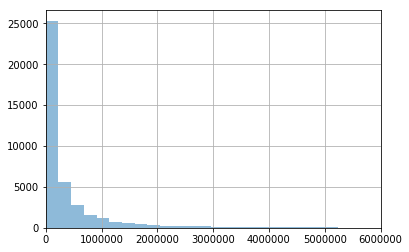

In [62]:
#直方图绘制
plt.xlim(0,6000000)
df[cname].hist(alpha=0.5,bins=500)
plt.show()

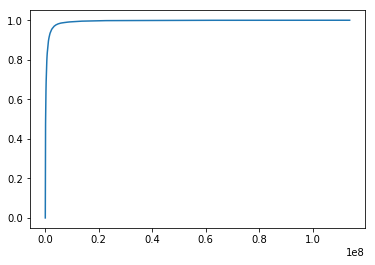

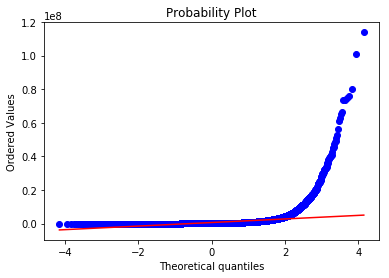

In [63]:
#累计分布图绘制
x=np.sort(df[cname])
y=np.arange(len(x))/float(len(x))
plt.plot(x,y)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(df[cname], dist="norm", plot=plt)
plt.show()

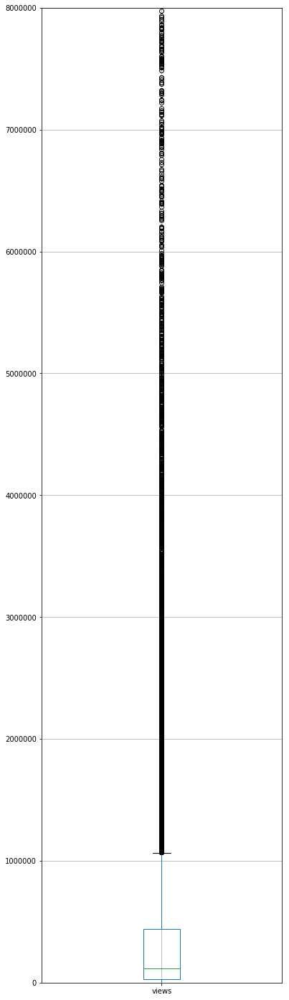

In [64]:
#盒图绘制
a=DataFrame(df,columns=[cname])
#a.boxplot()
a.boxplot(figsize=(6,25))
plt.ylim(0,8000000)
plt.show()


In [65]:
cname='likes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.084000e+04
mean     2.187550e+04
std      1.018000e+05
min      0.000000e+00
25%      5.330000e+02
50%      2.699000e+03
75%      1.179625e+04
max      4.924056e+06
Name: likes, dtype: float64
缺失值个数： 0


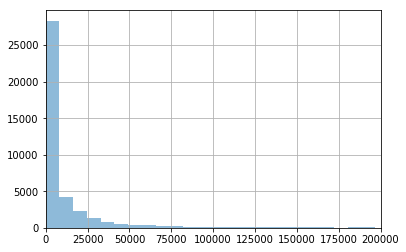

In [66]:
#直方图绘制
plt.xlim(0,200000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


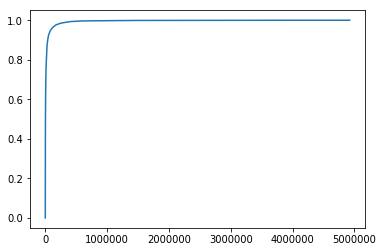

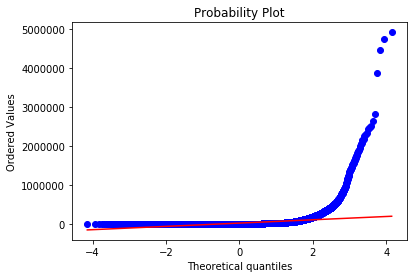

In [67]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


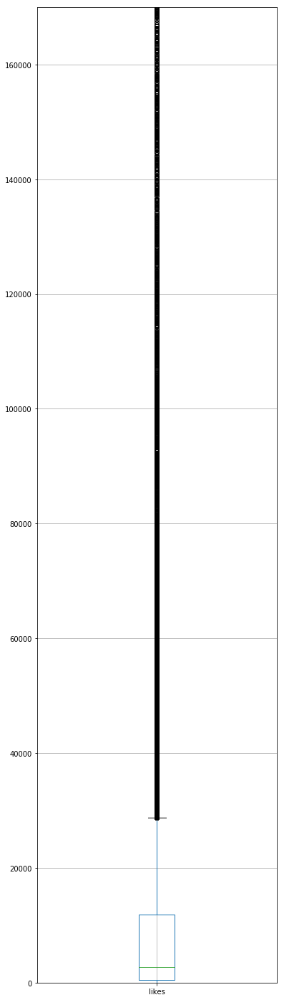

In [68]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,170000)
plt.show()

In [69]:
cname='dislikes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)

count    4.084000e+04
mean     1.397136e+03
std      1.457738e+04
min      0.000000e+00
25%      2.900000e+01
50%      1.340000e+02
75%      5.320000e+02
max      1.470386e+06
Name: dislikes, dtype: float64
缺失值个数： 0


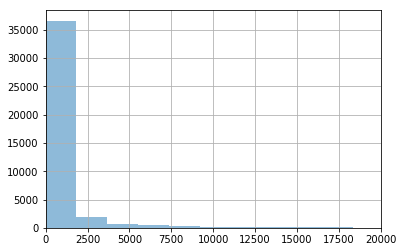

In [70]:

#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=800)
plt.show()

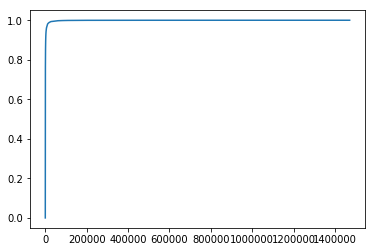

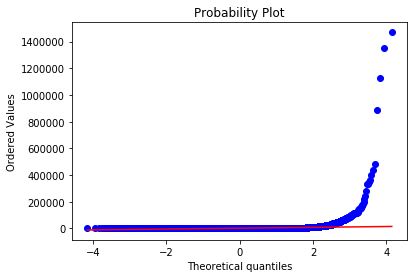

In [71]:

#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()

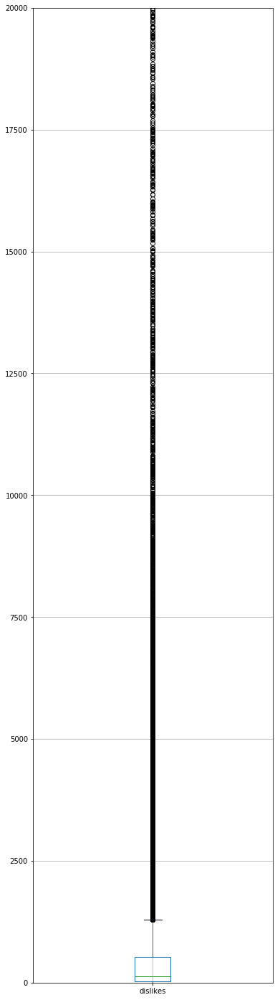

In [72]:

#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()


In [73]:
cname='comment_count'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.084000e+04
mean     2.785857e+03
std      1.745803e+04
min      0.000000e+00
25%      7.900000e+01
50%      3.760000e+02
75%      1.376000e+03
max      1.084435e+06
Name: comment_count, dtype: float64
缺失值个数： 0


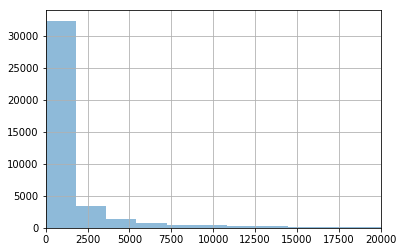

In [74]:
#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


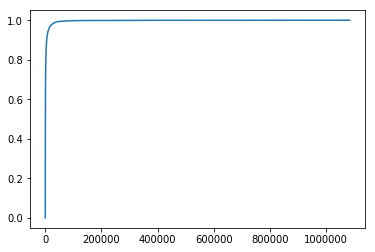

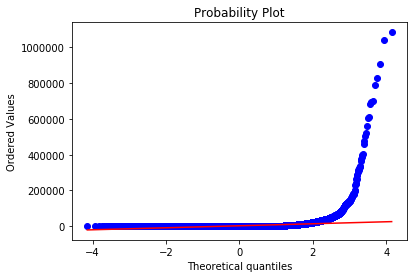

In [75]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


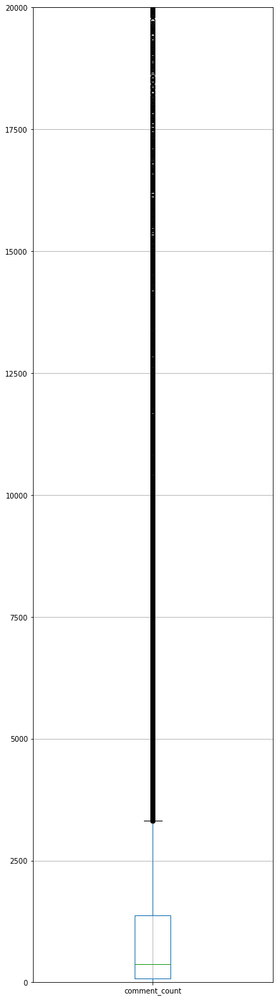

In [76]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()